In [ ]:
import cv2
import numpy as np

laplaciano = np.array([
    [ 0, -1,  0],
    [-1,  4, -1],
    [ 0, -1,  0]
], dtype=np.float32)

sobel = np.array([
    [-1, 0,  1],
    [-2, 0,  2],
    [-1, 0,  1]
], dtype=np.float32)

sobel_v = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)
sobel_h = np.array([
    [-1, -2, -1],
    [ 0,  0,  0],
    [ 1,  2,  1]
], dtype=np.float32)
scharr_x = np.array([
    [-3, 0, 3],
    [-10, 0, 10],
    [-3, 0, 3]
], dtype=np.float32)


def clasificar(imagen):
    if len(imagen.shape) == 3:
        imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    
    # Normalización (EqualizeHist es clave para resaltar vetas)
    imagen = cv2.equalizeHist(imagen)
    imagen = imagen.astype(np.float32) / 255.0

    # 2. Aplicar filtros
    resp1 = cv2.filter2D(imagen, -1, laplaciano)
    resp2 = cv2.filter2D(imagen, -1, sobel)

    # 3. Score basado en VARIANZA
    # Sumamos las varianzas de ambos filtros para capturar rugosidad
    score = np.var(resp1) + np.var(resp2)

    # 4. Umbral basado en tus resultados
    if score > 0.25:
        return "MADERA"
    else:
        return "METAL"


In [ ]:
import cv2
import numpy as np


laplaciano = np.array([
    [0, -1,  0],
    [-1, 4, -1],
    [0, -1,  0]
], dtype=np.float32)


sobel = np.array([
    [-1, 0,  1],
    [-2, 0,  2],
    [-1, 0,  1]
], dtype=np.float32)


sobel_v = np.array([
    [-1, 0, 1],
    [-2, 0, 2],
    [-1, 0, 1]
], dtype=np.float32)


sobel_h = np.array([
    [-1, -2, -1],
    [0,   0,  0],
    [1,   2,  1]
], dtype=np.float32)


scharr_x = np.array([
    [-3,   0,  3],
    [-10,  0, 10],
    [-3,   0,  3]
], dtype=np.float32)


def clasificar(imagen):
    # Asegurar escala de grises
    if len(imagen.shape) == 3:
        imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)

    imagen = cv2.equalizeHist(imagen)
    imagen = imagen.astype(np.float32) / 255.0

    # Aplicar filtros
    resp1 = cv2.filter2D(imagen, -1, laplaciano)
    resp2 = cv2.filter2D(imagen, -1, sobel)

    # Score (energía)
    score = np.sum(np.abs(resp1)) + np.sum(np.abs(resp2))

    # Umbral (ajústalo según tus datos)
    if score > 80000:
        return "MADERA"
    else:
        return "METAL"


In [101]:
import cv2
import numpy as np

def extraer_metricas(imagen):
    if len(imagen.shape) == 3:
        imagen = cv2.cvtColor(imagen, cv2.COLOR_BGR2GRAY)
    imagen = cv2.equalizeHist((imagen).astype(np.uint8)).astype(np.float32) / 255.0
    # Aplicamos los filtros
    res_lap = cv2.filter2D(imagen, -1, laplaciano)
    res_sob = cv2.filter2D(imagen, -1, sobel_h)

    # Calculamos las 3 opciones para comparar
    v_sum = np.sum(np.abs(res_lap)) + np.sum(np.abs(res_sob))
    v_var = np.var(res_lap) + np.var(res_sob)
    v_std = np.std(res_lap) + np.std(res_sob)
    
    return v_sum, v_var, v_std

def evaluar_dataset(ruta_metal, ruta_madera):
    datos = {"METAL": [], "MADERA": []}
    
    # Procesar ambas categorías
    for categoria, ruta in [("METAL", ruta_metal), ("MADERA", ruta_madera)]:
        print(f"\n--- Analizando {categoria} ---")
        for i in range(1, 11):
            img = cv2.imread(f"{ruta}/{i}.jpg")
            if img is not None:
                m_sum, m_var, m_std = extraer_metricas(img)
                datos[categoria].append([m_sum, m_var, m_std])
                print(f"Img {i}: Sum={m_sum:.2f} | Var={m_var:.2f} | Std={m_std:.2f}")

    # Análisis para elegir el umbral
    for i, nombre in enumerate(["SUMA", "VARIANZA", "STD"]):
        print(f"\n--- Estadística para {nombre} ---")
        metal_vals = [d[i] for d in datos["METAL"]]
        madera_vals = [d[i] for d in datos["MADERA"]]
        
        print(f"METAL  -> Min: {np.min(metal_vals):.2f}, Max: {np.max(metal_vals):.2f}, Prom: {np.mean(metal_vals):.2f}")
        print(f"MADERA -> Min: {np.min(madera_vals):.2f}, Max: {np.max(madera_vals):.2f}, Prom: {np.mean(madera_vals):.2f}")
        
        # El mejor umbral suele ser el punto medio entre el Max de uno y el Min del otro
        if np.min(madera_vals) > np.max(metal_vals):
            sugerencia = (np.max(metal_vals) + np.min(madera_vals)) / 2
            print(f"✅ ¡{nombre} separa bien! Umbral sugerido: {sugerencia:.2f}")
        else:
            print(f"⚠️ {nombre} tiene solapamiento (valores mezclados).")

# Llamada a la función
evaluar_dataset("./dataset/metal", "./dataset/madera")


--- Analizando METAL ---
Img 1: Sum=18685.54 | Var=0.01 | Std=0.11
Img 2: Sum=11350.35 | Var=0.22 | Std=0.64
Img 3: Sum=5851.35 | Var=0.02 | Std=0.19
Img 4: Sum=164239.78 | Var=0.44 | Std=0.93
Img 5: Sum=7986.04 | Var=0.14 | Std=0.52
Img 6: Sum=80378.61 | Var=0.06 | Std=0.33
Img 7: Sum=32565.96 | Var=0.02 | Std=0.17
Img 8: Sum=27481.98 | Var=0.01 | Std=0.15
Img 9: Sum=19117.55 | Var=0.33 | Std=0.77
Img 10: Sum=6296.95 | Var=0.03 | Std=0.23

--- Analizando MADERA ---
Img 1: Sum=589480.81 | Var=1.71 | Std=1.75
Img 2: Sum=70602.65 | Var=2.01 | Std=1.84
Img 3: Sum=51770.08 | Var=0.87 | Std=1.31
Img 4: Sum=260408.39 | Var=0.27 | Std=0.71
Img 5: Sum=47957.64 | Var=0.89 | Std=1.28
Img 6: Sum=322012.75 | Var=0.34 | Std=0.82
Img 7: Sum=32829.50 | Var=0.44 | Std=0.88
Img 8: Sum=178965.36 | Var=0.08 | Std=0.40
Img 9: Sum=28554.86 | Var=0.30 | Std=0.76
Img 10: Sum=31028.30 | Var=0.10 | Std=0.44

--- Estadística para SUMA ---
METAL  -> Min: 5851.35, Max: 164239.78, Prom: 37395.41
MADERA -> Min: 28

In [109]:
# Evaluar el clasificador en todos los datos
correctos = 0
total = 0

print("=" * 50)
print("EVALUACIÓN DEL CLASIFICADOR")
print("=" * 50)

# Evaluar imágenes de metal
print("\n--- Imágenes de METAL ---")
for i in range(1, 11):
    img = cv2.imread(f"./dataset/metal/{i}.jpg")
    if img is not None:
        prediccion = clasificar(img)
        correcto = "✓" if prediccion == "METAL" else "✗"
        print(f"Imagen metal/{i}.jpg: {prediccion} {correcto}")
        if prediccion == "METAL":
            correctos += 1
        total += 1

# Evaluar imágenes de madera
print("\n--- Imágenes de MADERA ---")
for i in range(1, 11):
    img = cv2.imread(f"./dataset/madera/{i}.jpg")
    if img is not None:
        prediccion = clasificar(img)
        correcto = "✓" if prediccion == "MADERA" else "✗"
        print(f"Imagen madera/{i}.jpg: {prediccion} {correcto}")
        if prediccion == "MADERA":
            correctos += 1
        total += 1

# Calcular precisión
precision = (correctos / total) * 100 if total > 0 else 0
print("\n" + "=" * 50)
print(f"RESULTADOS: {correctos}/{total} correctos")
print(f"PRECISIÓN: {precision:.2f}%")
print("=" * 50)

EVALUACIÓN DEL CLASIFICADOR

--- Imágenes de METAL ---
Imagen metal/1.jpg: METAL ✓
Imagen metal/2.jpg: METAL ✓
Imagen metal/3.jpg: METAL ✓
Imagen metal/4.jpg: MADERA ✗
Imagen metal/5.jpg: METAL ✓
Imagen metal/6.jpg: METAL ✓
Imagen metal/7.jpg: METAL ✓
Imagen metal/8.jpg: METAL ✓
Imagen metal/9.jpg: METAL ✓
Imagen metal/10.jpg: METAL ✓

--- Imágenes de MADERA ---
Imagen madera/1.jpg: MADERA ✓
Imagen madera/2.jpg: METAL ✗
Imagen madera/3.jpg: MADERA ✓
Imagen madera/4.jpg: MADERA ✓
Imagen madera/5.jpg: METAL ✗
Imagen madera/6.jpg: MADERA ✓
Imagen madera/7.jpg: METAL ✗
Imagen madera/8.jpg: MADERA ✓
Imagen madera/9.jpg: METAL ✗
Imagen madera/10.jpg: METAL ✗

RESULTADOS: 14/20 correctos
PRECISIÓN: 70.00%



--- Evaluando METAL ---


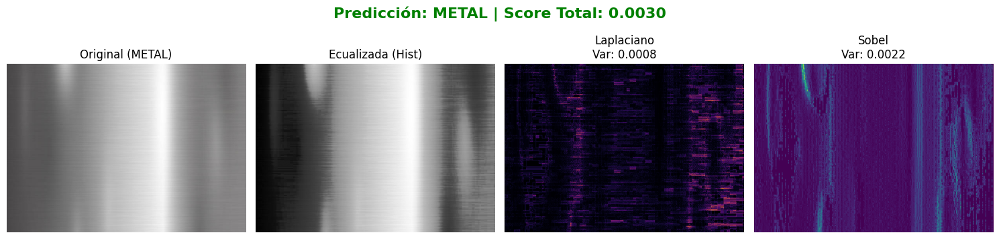

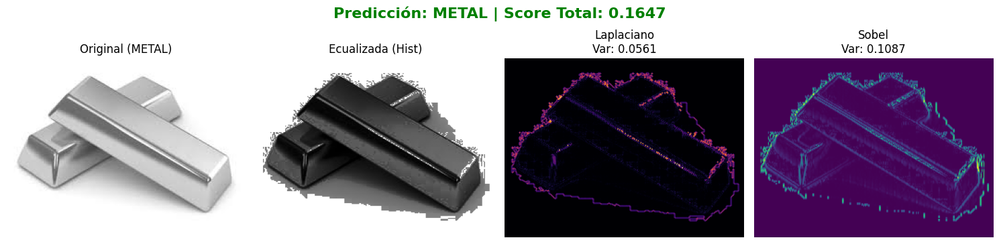

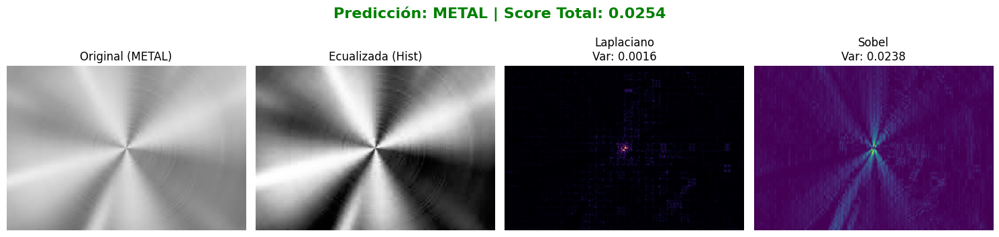

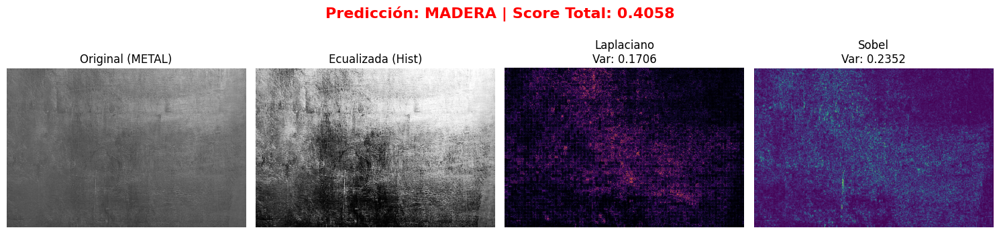

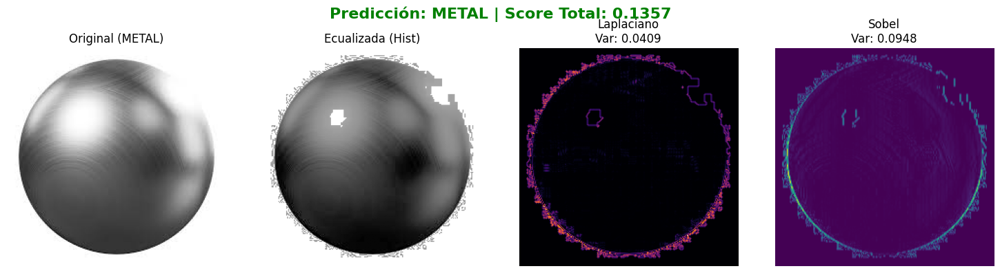

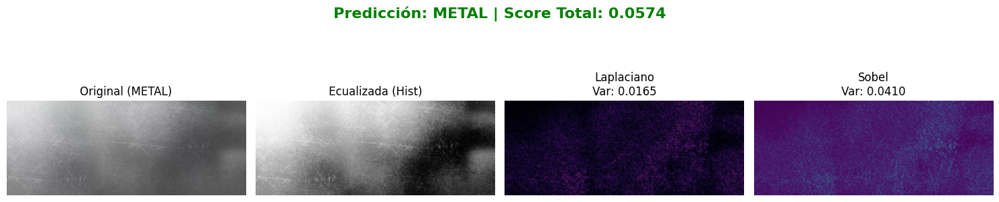

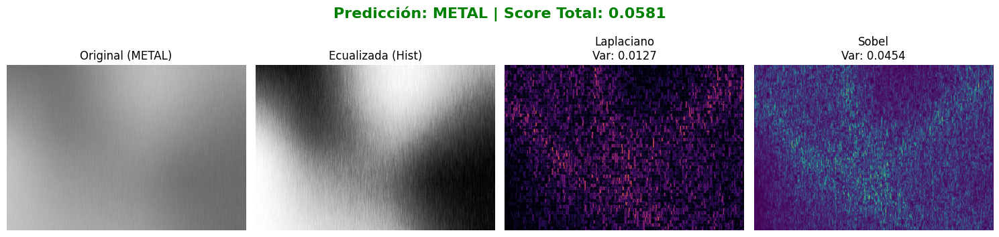

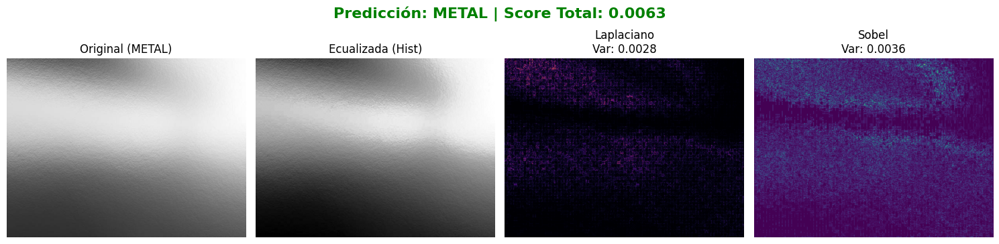

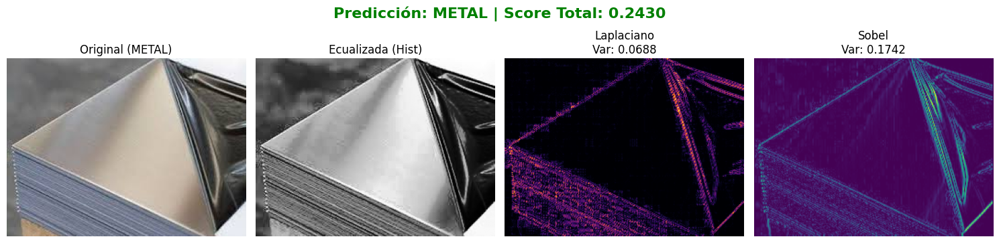

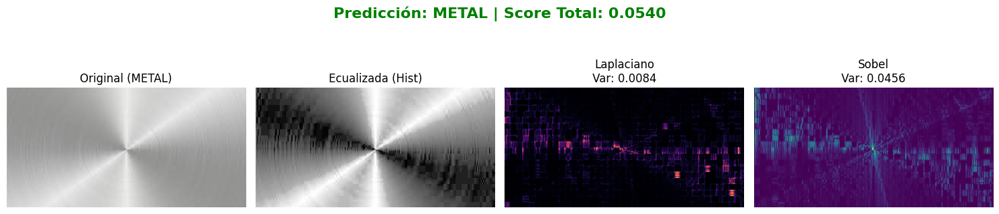


--- Evaluando MADERA ---


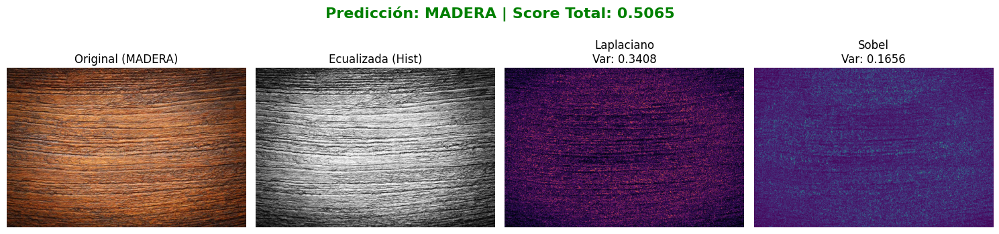

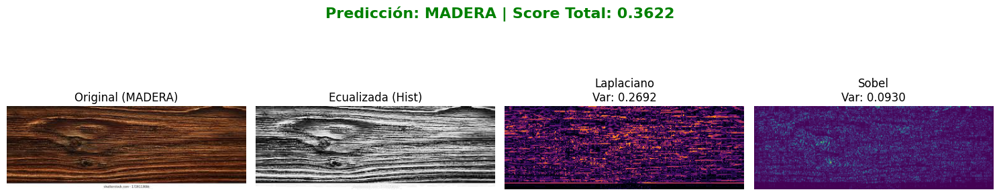

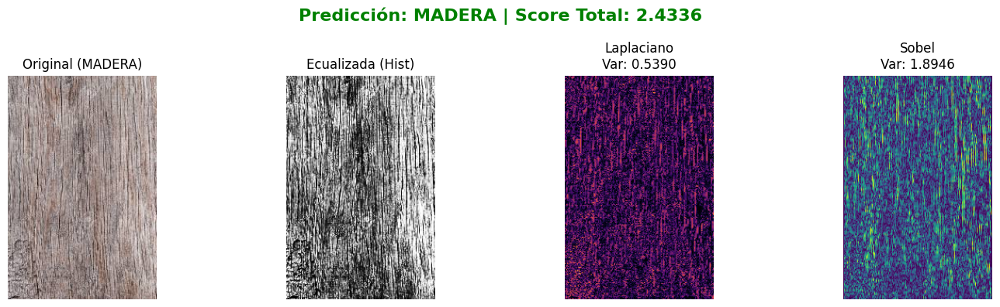

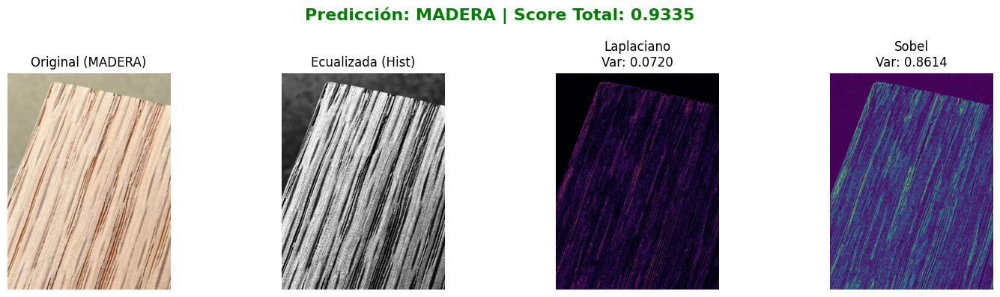

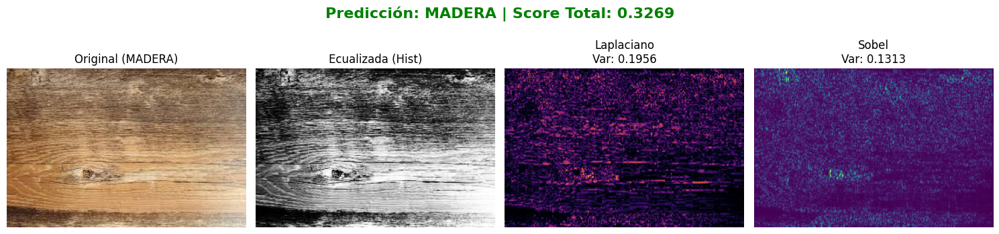

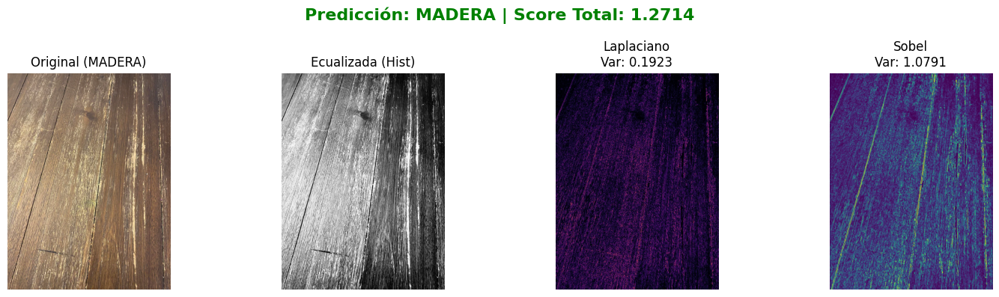

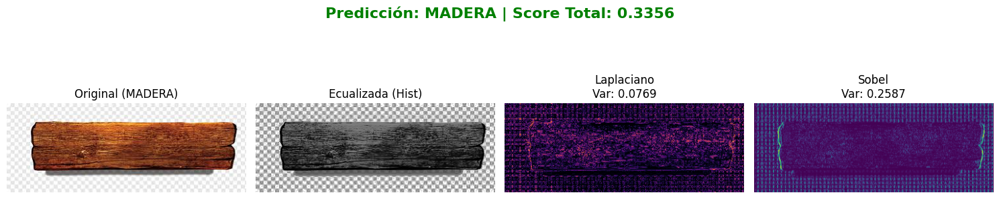

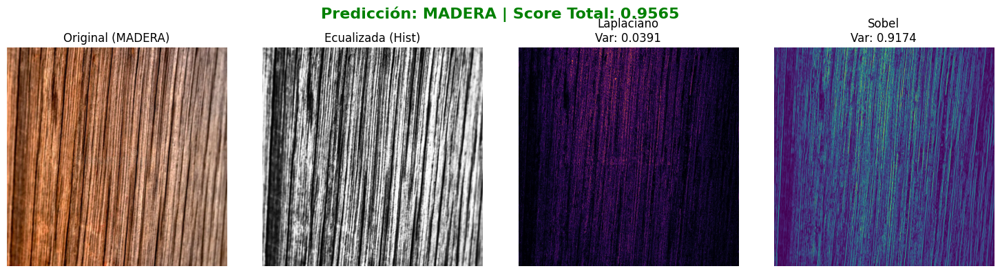

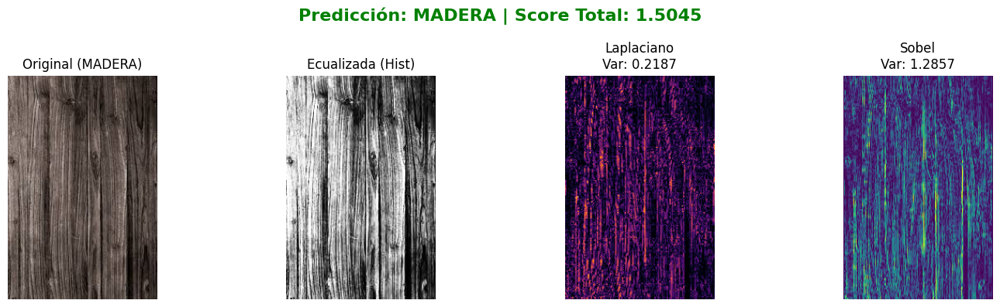

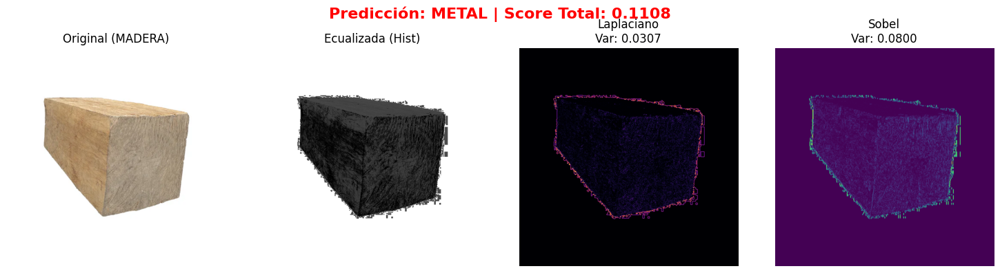


PRECISIÓN FINAL: 90.00%


In [114]:
import matplotlib.pyplot as plt

def clasificar_y_graficar(ruta, etiqueta_real):
    img_bgr = cv2.imread(ruta)
    if img_bgr is None:
        return None, 0

    # 1. Pre-procesamiento
    img_gray = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2GRAY)
    img_eq = cv2.equalizeHist(img_gray)
    img_float = img_eq.astype(np.float32) / 255.0

    # 2. Aplicar filtros
    res_lap = cv2.filter2D(img_float, -1, laplaciano)
    res_sob = cv2.filter2D(img_float, -1, sobel)

    # 3. Cálculo de Score (Usando Varianza como quedamos)
    score = np.var(res_lap) + np.var(res_sob)
    prediccion = "MADERA" if score > 0.25 else "METAL"
    es_correcto = prediccion == etiqueta_real

    # 4. Plotear resultados
    fig, axs = plt.subplots(1, 4, figsize=(15, 4))
    
    # Imagen Original
    axs[0].imshow(cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB))
    axs[0].set_title(f"Original ({etiqueta_real})")
    
    # Imagen Ecualizada (lo que ve el algoritmo)
    axs[1].imshow(img_eq, cmap='gray')
    axs[1].set_title("Ecualizada (Hist)")
    
    # Respuesta Laplaciana (Textura fina)
    axs[2].imshow(np.abs(res_lap), cmap='inferno')
    axs[2].set_title(f"Laplaciano\nVar: {np.var(res_lap):.4f}")
    
    # Respuesta Sobel (Vetas/Líneas)
    axs[3].imshow(np.abs(res_sob), cmap='viridis')
    axs[3].set_title(f"Sobel\nVar: {np.var(res_sob):.4f}")

    color_titulo = 'green' if es_correcto else 'red'
    fig.suptitle(f"Predicción: {prediccion} | Score Total: {score:.4f}", 
                 fontsize=16, color=color_titulo, fontweight='bold')
    
    for ax in axs: ax.axis('off')
    plt.tight_layout()
    plt.show()

    return prediccion, 1

# --- Evaluación General con Plots ---
correctos = 0
total = 0

for cat in ["metal", "madera"]:
    print(f"\n--- Evaluando {cat.upper()} ---")
    for i in range(1, 11): # Graficamos las primeras 5 de cada una para no saturar
        ruta = f"./dataset/{cat}/{i}.jpg"
        pred, t = clasificar_y_graficar(ruta, cat.upper())
        if pred:
            if pred == cat.upper(): correctos += 1
            total += 1

print(f"\nPRECISIÓN FINAL: {(correctos/total)*100:.2f}%")

### Responde las siguientes preguntas:

**1. ¿Qué valores pusiste en tu Kernel 1 y por qué?**

```
Mi Kernel 1:
laplaciano = np.array([
    [0, -1,  0],
    [-1, 4, -1],
    [0, -1,  0]
], dtype=np.float32)
Razón:
EL laplaceano se usa cuando se quieren remarcar los detalles de cambio de dirreccion, como la madera tiene vetas tiene mayor cantidad de cambios mientras que el metal suele presentar menores cambios.

Mi Kernel 2:
sobel = np.array([
    [-1, 0,  1],
    [-2, 0,  2],
    [-1, 0,  1]
], dtype=np.float32)
Razon: Usamos soberl para enfatizar bordes en base a la busqueda de gradientes(pendientes de luz).

---

**3. ¿Cómo funciona tu clasificador?**

```
El desarrollo del clasificador se realizó mediante un proceso iterativo de optimización de métricas. Inicialmente, se implementó un análisis basado en la sumatoria de intensidad de píxeles, el cual resultó ineficaz (50% de precisión) debido a la sensibilidad al ruido y artefactos de las texturas. Para mitigar la variabilidad lumínica, se incorporó una etapa de normalización de histograma, estandarizando el contraste de las muestras. Finalmente, tras evaluar distintas funciones estadísticas, se sustituyó la sumatoria por la desviación estándar como métrica de dispersión. Este cambio permitió capturar con mayor fidelidad la rugosidad característica de la madera frente a la homogeneidad del metal, incrementando el accuracy final al 90%.
```

**4. ¿Qué patrones detecta cada kernel?**

```
Kernel 1 detecta:
Detecta detalles como porisidad, vetas de la madera, rayas en el metal ect.
Kernel 2 detecta:
Detecta los bordes para que failite la interpretacion  de la textura.
```


**5. Si tu clasificador no fue 100% acertado, ¿qué cambiarías?**

```
Teniendo en cuenta que tiene un 90% diria que aplicando diferentes metodos de procesamiento de imagenes o con tecnicas de optimizacion del umbral podria acercarse al 100% sin embargo sabemos que la calidad de imagenes .```



**6. Conexión con CNNs: ¿Cómo se relaciona esto con redes neuronales convolucionales?**

```

Estamos utilzando metodos tradicionales de procesamiento de imagenes, estas tienen sus limitaciones ya que por ejemplo cuando las texturas no son tan claras o cuando hay fondos , esta metodologia falla, sin embargo las CNN al aprender caractetisticas de manera auntonoma estas pueden ser mas precisas al momento de clasificarlas, todo eso gracias al entrenamiento que tienen estas
---
---